<p style="text-align:center">
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo"  />
    </a>
</p>


# **Bubble Plots**


Estimated time needed: **30** minutes


In this lab, you will focus on visualizing data.

The dataset will be directly loaded into pandas for analysis and visualization.

You will use various visualization techniques to explore the data and uncover key trends.


## Objectives


In this lab, you will perform the following:


-   Visualize the distribution of data.

-   Visualize the relationship between two data features.

-   Visualize composition of data.

-   Visualize comparison of data.


#### Setup: Working with the Database
**Install and import the needed libraries**


In [1]:
!pip install pandas 
!pip install matplotlib
!pip install seaborn

import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

**Download and connect to the database file containing survey data.**


To start, download and load the dataset into a `pandas` DataFrame.



In [2]:
# Step 1: Download the dataset
!wget -O survey-data.csv https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

# Load the data
df = pd.read_csv("survey-data.csv")

# Display the first few rows of the data to understand its structure
df.head()


--2025-05-11 17:50:54--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
200 OKequest sent, awaiting response... 
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  66.9MB/s    in 2.3s    

2025-05-11 17:50:57 (66.9 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


### Task 1: Exploring Data Distributions Using Bubble Plots


#### 1. Bubble Plot for Age vs. Frequency of Participation


- Visualize the relationship between respondents’ age and their participation frequency (`SOPartFreq`) using a bubble plot.

- Use the size of the bubbles to represent their job satisfaction (`JobSat`).


/tmp/ipykernel_915/3847229544.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['JobSat'].fillna(0, inplace=True)  # Replace with 0


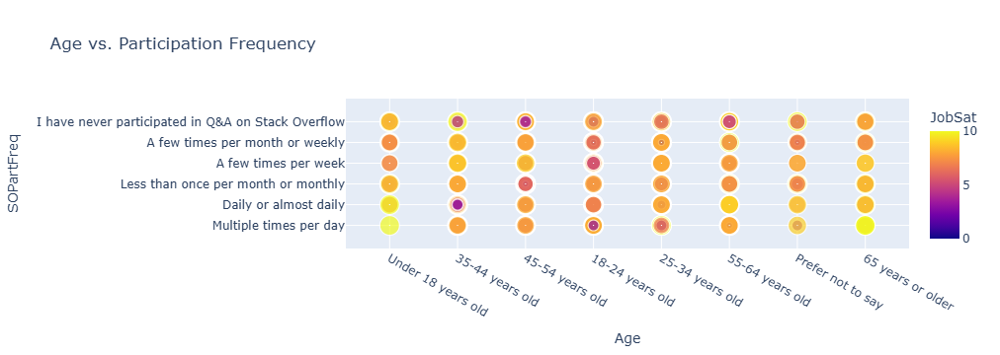

In [3]:
# Replace NaN values in 'JobSat' with a suitable value (e.g., 0 or the mean)
df['JobSat'].fillna(0, inplace=True)  # Replace with 0
# Or
# df['JobSat'].fillna(df['JobSat'].mean(), inplace=True) #Replace with the mean

# Create the bubble plot
fig = px.scatter(df, x='Age', y='SOPartFreq', size='JobSat', color='JobSat',
                 hover_data=['Age', 'SOPartFreq', 'JobSat'], title='Age vs. Participation Frequency')
fig.show()

/tmp/ipykernel_915/1741979061.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



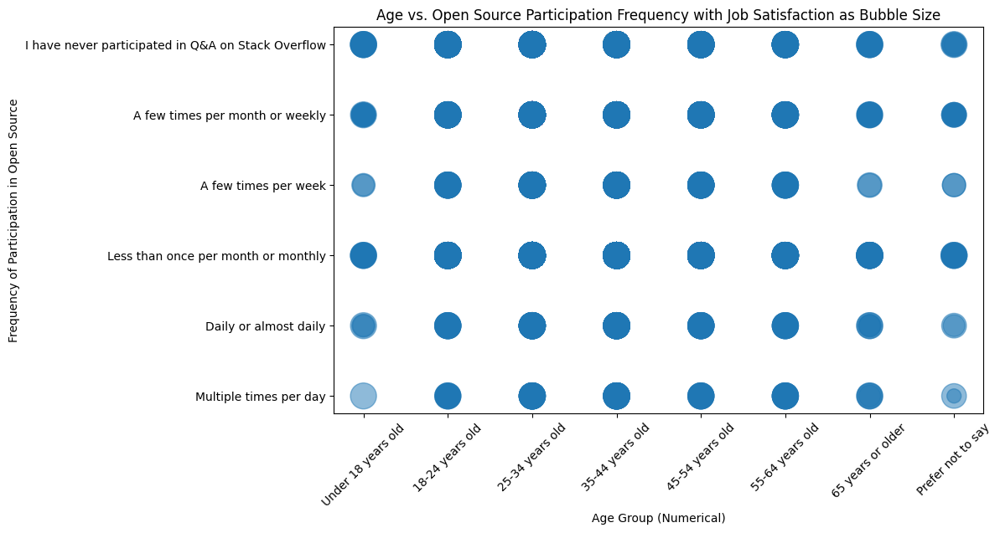

In [4]:
# Filter out missing values
df_filtered = df[(df['Age'].notna()) & (df['SOPartFreq'].notna()) & (df['JobSat'].notna())]

# Create a dictionary to map age ranges to numerical values
age_mapping = {
    'Under 18 years old': 0,
    '18-24 years old': 1,
    '25-34 years old': 2,
    '35-44 years old': 3,
    '45-54 years old': 4,
    '55-64 years old': 5,
    '65 years or older': 6,
    'Prefer not to say': 7
}

# Apply the mapping using apply
df_filtered['AgeNum'] = df_filtered['Age'].apply(lambda x: age_mapping.get(x, x))

# Create the bubble plot
plt.figure(figsize=(10, 6))
plt.scatter(df_filtered['AgeNum'], df_filtered['SOPartFreq'],
            s=df_filtered['JobSat'] * 50,  # Adjust bubble size scaling as needed
            alpha=0.5)

# Set labels and title
plt.xlabel('Age Group (Numerical)')
plt.ylabel('Frequency of Participation in Open Source')
plt.title('Age vs. Open Source Participation Frequency with Job Satisfaction as Bubble Size')

# Customize x-axis labels
plt.xticks(range(8), age_mapping.keys(), rotation=45)

# Show the plot
plt.show()

#### 2. Bubble Plot for Compensation vs. Job Satisfaction


-Visualize the relationship between yearly compensation (`ConvertedCompYearly`) and job satisfaction (`JobSat`).

- Use the size of the bubbles to represent respondents’ age.


/tmp/ipykernel_915/928658370.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



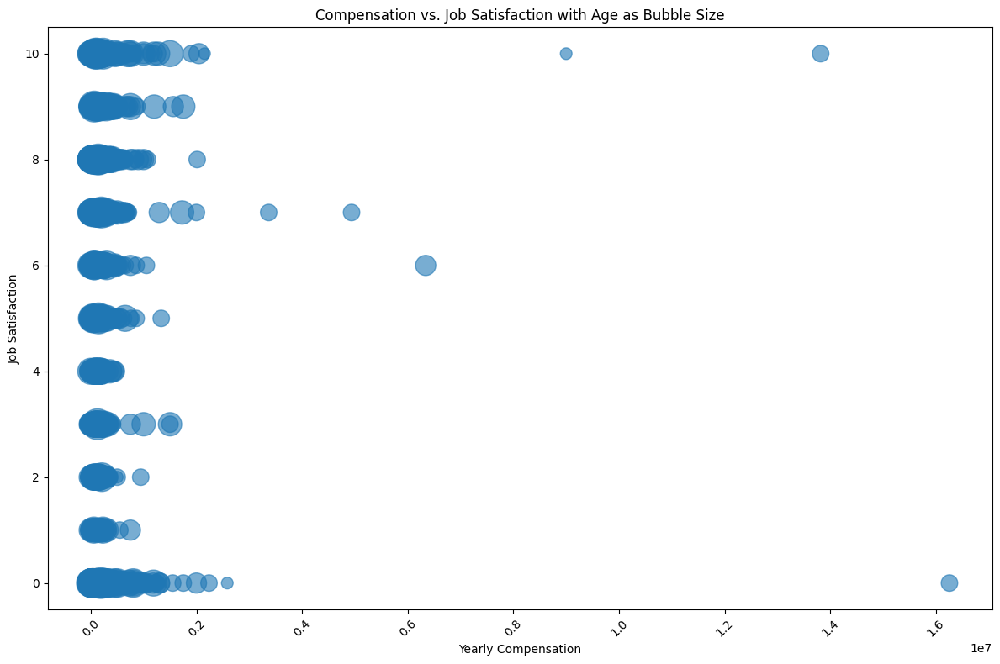

In [5]:
# Assuming df is already loaded as in the provided code

# Filter out missing values and convert 'ConvertedCompYearly' to numeric, coercing errors to NaN
df_filtered = df[(df['ConvertedCompYearly'].notna()) & (df['JobSat'].notna()) & (df['Age'].notna())]
df_filtered['ConvertedCompYearly'] = pd.to_numeric(df_filtered['ConvertedCompYearly'], errors='coerce')
df_filtered = df_filtered.dropna(subset=['ConvertedCompYearly'])

# Create a dictionary to map age ranges to numerical values (as before)
age_mapping = {
    'Under 18 years old': 0,
    '18-24 years old': 1,
    '25-34 years old': 2,
    '35-44 years old': 3,
    '45-54 years old': 4,
    '55-64 years old': 5,
    '65 years or older': 6,
    'Prefer not to say': 7
}

# Apply the mapping using apply
df_filtered['AgeNum'] = df_filtered['Age'].apply(lambda x: age_mapping.get(x, x))


# Create the bubble plot
plt.figure(figsize=(12, 8))
plt.scatter(df_filtered['ConvertedCompYearly'], df_filtered['JobSat'],
            s=df_filtered['AgeNum'] * 100,  # Adjust bubble size scaling as needed
            alpha=0.6)

# Set labels and title
plt.xlabel('Yearly Compensation')
plt.ylabel('Job Satisfaction')
plt.title('Compensation vs. Job Satisfaction with Age as Bubble Size')


# Improve readability
plt.xticks(rotation=45)
plt.yscale('linear') # Or 'log' if needed
plt.tight_layout()

# Show the plot
plt.show()

/tmp/ipykernel_915/955741834.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



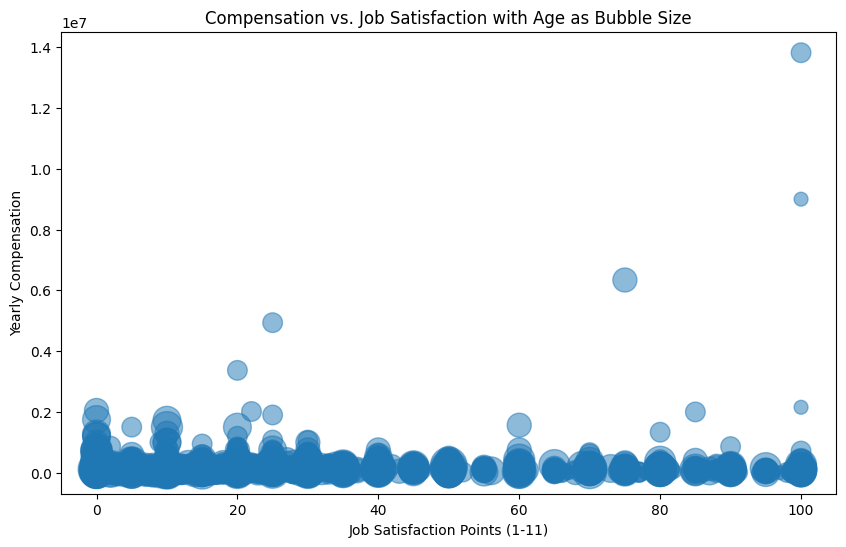

In [6]:
# Filter out missing values
df_filtered = df[df['ConvertedCompYearly'].notna() &
                 df['JobSatPoints_6'].notna() &
                 df['Age'].notna()]

# Create a dictionary to map age ranges to numerical values
age_mapping = {
    'Under 18 years old': 0,
    '18-24 years old': 1,
    '25-34 years old': 2,
    '35-44 years old': 3,
    '45-54 years old': 4,
    '55-64 years old': 5,
    '65 years or older': 6,
    'Prefer not to say': 7
}

# Apply the mapping using apply
df_filtered['AgeNum'] = df_filtered['Age'].apply(lambda x: age_mapping.get(x, x))

# Create the bubble plot
plt.figure(figsize=(10, 6))
plt.scatter(df_filtered['JobSatPoints_6'],
            df_filtered['ConvertedCompYearly'],
            s=df_filtered['AgeNum'] * 100,  # Adjust bubble size scaling as needed
            alpha=0.5)

# Set labels and title
plt.xlabel('Job Satisfaction Points (1-11)')
plt.ylabel('Yearly Compensation')
plt.title('Compensation vs. Job Satisfaction with Age as Bubble Size')

# Show the plot
plt.show()

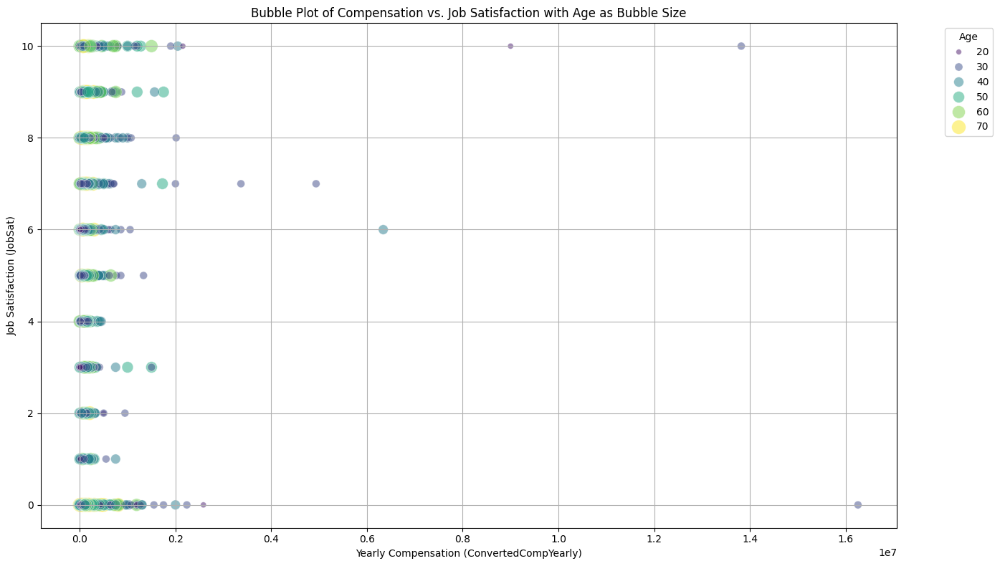

In [7]:
# Convert the 'Age' column to numeric values for bubble size
age_mapping = {
    'Under 18 years old': 17, '18-24 years old': 21, '25-34 years old': 29, '35-44 years old': 39,
    '45-54 years old': 49, '55-64 years old': 59, '65 years or older': 70, 'Prefer not to say': None
}
df['AgeNum'] = df['Age'].map(age_mapping)

# Filter out rows with missing values in 'ConvertedCompYearly', 'JobSat', and 'AgeNum'
df_filtered = df.dropna(subset=['ConvertedCompYearly', 'JobSat', 'AgeNum'])

# Create the bubble plot
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(data=df_filtered, x='ConvertedCompYearly', y='JobSat',
                              size='AgeNum', sizes=(20, 200), alpha=0.5, hue='AgeNum', palette='viridis')
plt.title('Bubble Plot of Compensation vs. Job Satisfaction with Age as Bubble Size')
plt.xlabel('Yearly Compensation (ConvertedCompYearly)')
plt.ylabel('Job Satisfaction (JobSat)')
plt.legend(title='Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Adjust the layout to ensure labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()

### Task 2: Analyzing Relationships Using Bubble Plots


#### 1. Bubble Plot of Technology Preferences by Age

- Visualize the popularity of programming languages respondents have worked with (`LanguageHaveWorkedWith`) across age groups.

- Use bubble size to represent the frequency of each language.



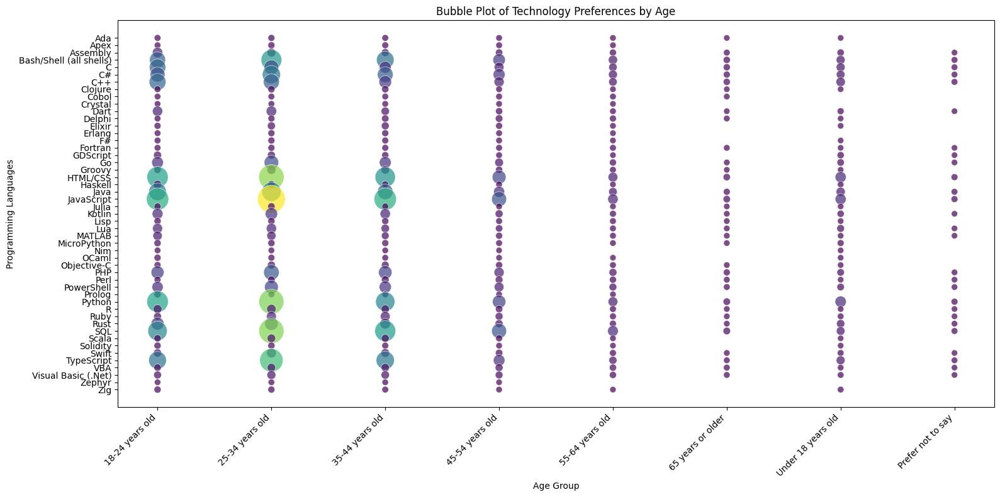

In [8]:
# Prepare the data: explode the 'LanguageHaveWorkedWith' column
df_exploded = df.assign(LanguageHaveWorkedWith=df['LanguageHaveWorkedWith'].str.split(';')).explode('LanguageHaveWorkedWith')

# Create a dictionary to map age ranges to numerical values
age_mapping = {
    'Under 18 years old': 17, '18-24 years old': 21, '25-34 years old': 29, '35-44 years old': 39,
    '45-54 years old': 49, '55-64 years old': 59, '65 years or older': 70, 'Prefer not to say': None
}
df_exploded['AgeNum'] = df_exploded['Age'].map(age_mapping)

# Group by language and age to count occurrences
language_age_counts = df_exploded.groupby(['LanguageHaveWorkedWith', 'Age'])['LanguageHaveWorkedWith'].count().reset_index(name='Count')

# Filter out languages with very low occurrences (optional, for better visualization)
language_age_counts = language_age_counts[language_age_counts['Count'] > 10]

# Create the bubble plot
plt.figure(figsize=(16, 8))

sns.scatterplot(data=language_age_counts, x='Age', y='LanguageHaveWorkedWith',
                size='Count', sizes=(50, 1000), alpha=0.7, hue='Count', palette='viridis', legend=False)

# Customize the plot
plt.title('Bubble Plot of Technology Preferences by Age')
plt.xlabel('Age Group')
plt.ylabel('Programming Languages')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()

plt.show()

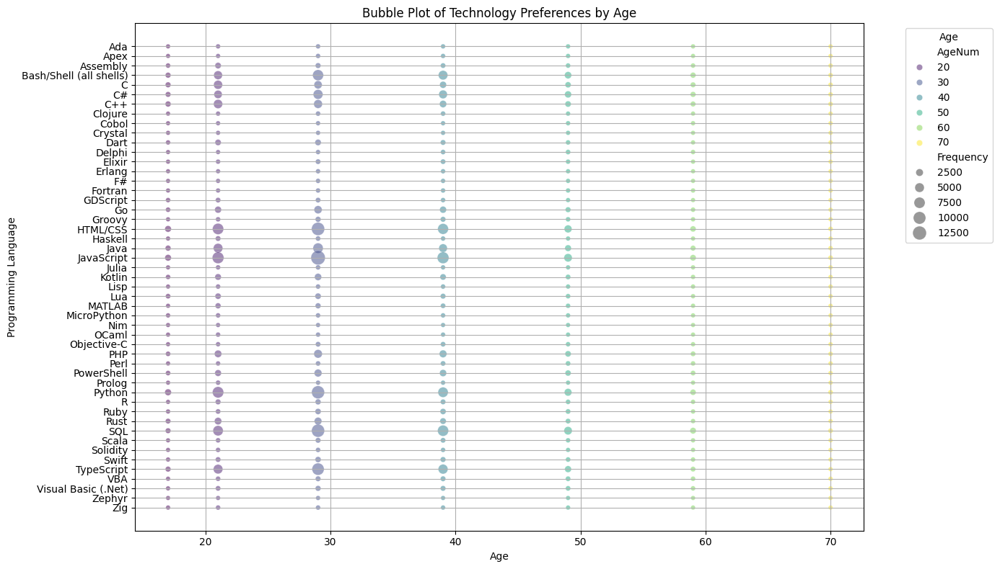

In [9]:
# Convert the 'Age' column to numeric values for bubble size
age_mapping = {
    'Under 18 years old': 17, '18-24 years old': 21, '25-34 years old': 29, '35-44 years old': 39,
    '45-54 years old': 49, '55-64 years old': 59, '65 years or older': 70, 'Prefer not to say': None
}
df['AgeNum'] = df['Age'].map(age_mapping)

# Filter out rows with missing values in 'LanguageHaveWorkedWith' and 'AgeNum'
df_filtered = df.dropna(subset=['LanguageHaveWorkedWith', 'AgeNum'])

# Explode the 'LanguageHaveWorkedWith' column by splitting it by ';' and stacking the results
df_exploded = df_filtered.assign(LanguageHaveWorkedWith=df_filtered['LanguageHaveWorkedWith'].str.split(';')).explode('LanguageHaveWorkedWith')

# Calculate the frequency of each language within each age group
language_age_freq = df_exploded.groupby(['LanguageHaveWorkedWith', 'AgeNum']).size().reset_index(name='Frequency')

# Create the bubble plot
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(data=language_age_freq, x='AgeNum', y='LanguageHaveWorkedWith',
                              size='Frequency', sizes=(20, 200), alpha=0.5, hue='AgeNum', palette='viridis')
plt.title('Bubble Plot of Technology Preferences by Age')
plt.xlabel('Age')
plt.ylabel('Programming Language')
plt.legend(title='Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Adjust the layout to ensure labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()

#### 2. Bubble Plot for Preferred Databases vs. Job Satisfaction

- Explore the relationship between preferred databases (`DatabaseWantToWorkWith`) and job satisfaction.

- Use bubble size to indicate the number of respondents for each database.


/tmp/ipykernel_915/2955428084.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



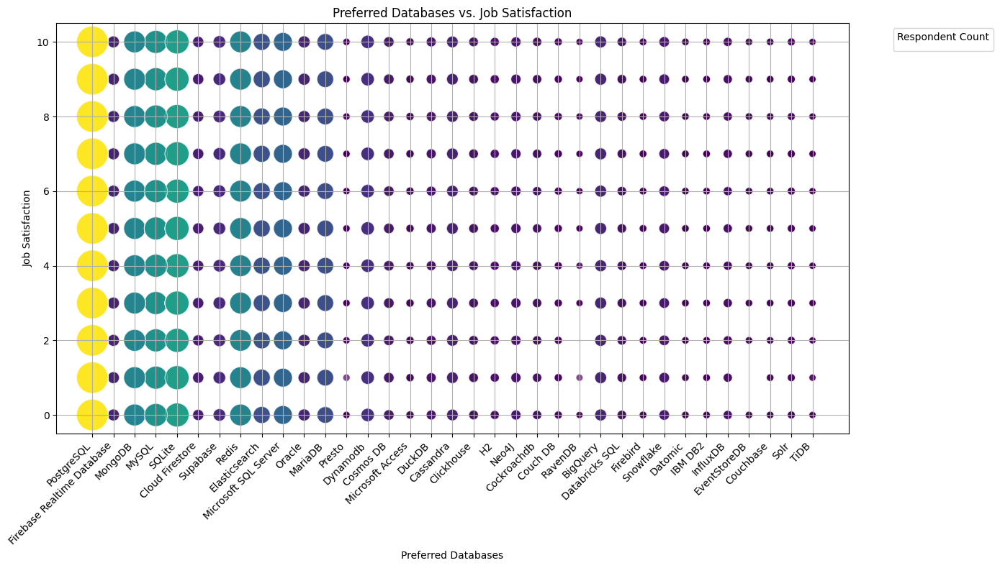

In [10]:
# Prepare the data
df_exploded = df.assign(DatabaseWantToWorkWith=df['DatabaseWantToWorkWith'].str.split(';')).explode('DatabaseWantToWorkWith')
database_counts = df_exploded.groupby('DatabaseWantToWorkWith')['JobSat'].count().reset_index(name='RespondentCount')

# Merge with original DataFrame for job satisfaction values
df_merged = pd.merge(df_exploded, database_counts, on='DatabaseWantToWorkWith')

# Filter out databases with very few responses (optional)
df_merged = df_merged[df_merged['RespondentCount'] > 10]

# Create the bubble plot
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df_merged, x='DatabaseWantToWorkWith', y='JobSat', size='RespondentCount',
                sizes=(50, 1000), alpha=0.7, hue='RespondentCount', palette='viridis', legend=False)

# Customize the plot
plt.title('Preferred Databases vs. Job Satisfaction')
plt.xlabel('Preferred Databases')
plt.ylabel('Job Satisfaction')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Respondent Count', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()

plt.show()

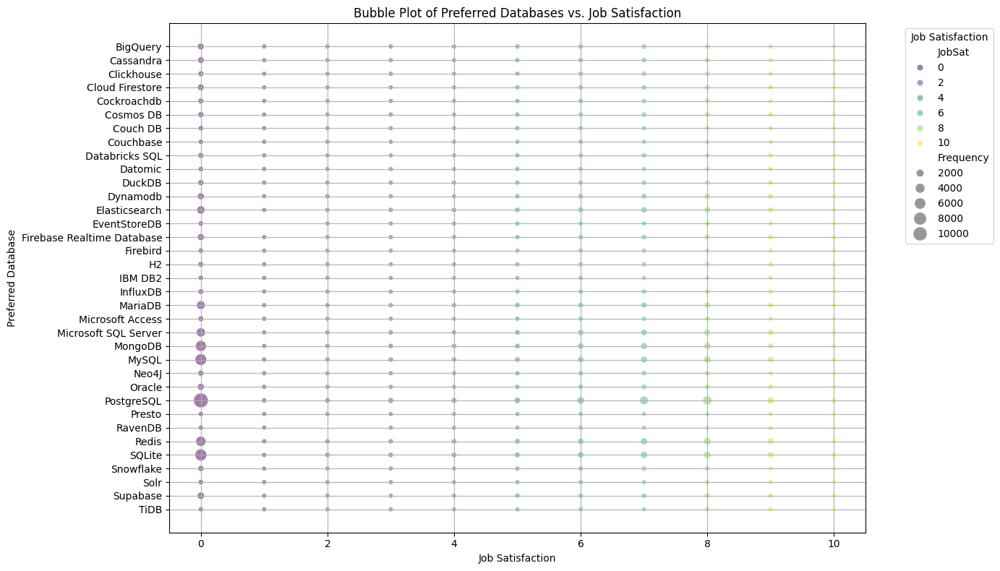

In [11]:
# Filter out rows with missing values in 'DatabaseWantToWorkWith' and 'JobSat'
df_filtered = df.dropna(subset=['DatabaseWantToWorkWith', 'JobSat'])

# Explode the 'DatabaseWantToWorkWith' column by splitting it by ';' and stacking the results
df_exploded = df_filtered.assign(DatabaseWantToWorkWith=df_filtered['DatabaseWantToWorkWith'].str.split(';')).explode('DatabaseWantToWorkWith')

# Calculate the frequency of each database within each job satisfaction level
database_job_sat_freq = df_exploded.groupby(['DatabaseWantToWorkWith', 'JobSat']).size().reset_index(name='Frequency')

# Create the bubble plot
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(data=database_job_sat_freq, x='JobSat', y='DatabaseWantToWorkWith',
                              size='Frequency', sizes=(20, 200), alpha=0.5, hue='JobSat', palette='viridis')
plt.title('Bubble Plot of Preferred Databases vs. Job Satisfaction')
plt.xlabel('Job Satisfaction')
plt.ylabel('Preferred Database')
plt.legend(title='Job Satisfaction', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Adjust the layout to ensure labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()

### Task 3: Comparing Data Using Bubble Plots


#### 1. Bubble Plot for Compensation Across Developer Roles

- Visualize compensation (`ConvertedCompYearly`) across different developer roles (`DevType`).

- Use bubble size to represent job satisfaction.


/tmp/ipykernel_915/652390814.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



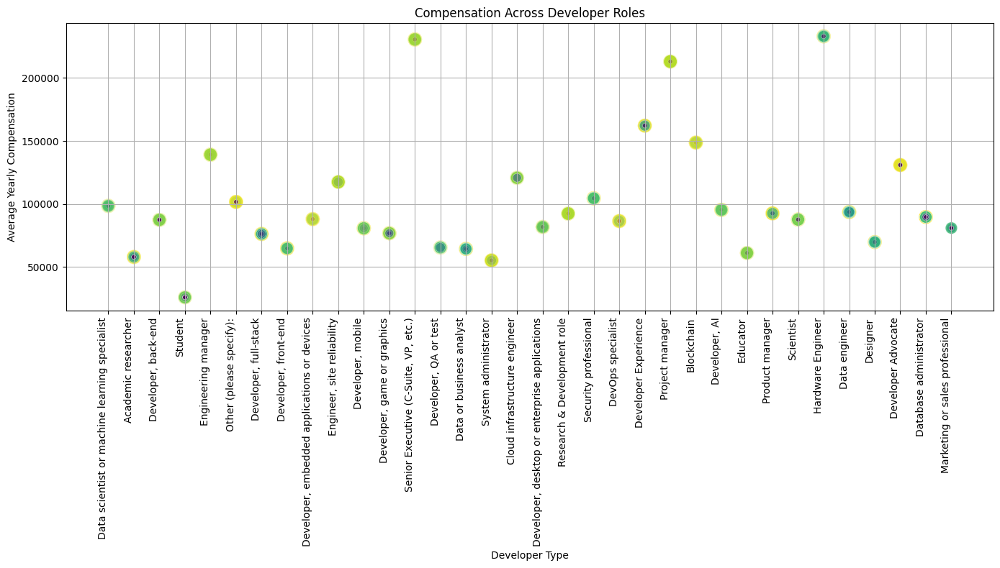

In [12]:
# prompt: write a code for Comparing Data Using Bubble Plots
# 1. Bubble Plot for Compensation Across Developer Roles
# Visualize compensation (ConvertedCompYearly) across different developer roles (DevType).
# Use bubble size to represent job satisfaction.

# Filter out rows with missing values in 'DevType', 'ConvertedCompYearly', and 'JobSat'
df_filtered = df.dropna(subset=['DevType', 'ConvertedCompYearly', 'JobSat'])

# Convert 'ConvertedCompYearly' to numeric, coercing errors to NaN
df_filtered['ConvertedCompYearly'] = pd.to_numeric(df_filtered['ConvertedCompYearly'], errors='coerce')

# Drop rows with NaN values in 'ConvertedCompYearly' after conversion
df_filtered = df_filtered.dropna(subset=['ConvertedCompYearly'])

# Explode the 'DevType' column
df_exploded = df_filtered.assign(DevType=df_filtered['DevType'].str.split(';')).explode('DevType')

# Group data and calculate the mean compensation for each developer type
dev_type_compensation = df_exploded.groupby('DevType')['ConvertedCompYearly'].mean().reset_index()

# Merge with the original dataframe to get job satisfaction
df_merged = pd.merge(df_exploded, dev_type_compensation, on='DevType', suffixes=('', '_mean'))


# Create the bubble plot
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df_merged, x='DevType', y='ConvertedCompYearly_mean', size='JobSat',
                sizes=(20, 200), alpha=0.6, hue='JobSat', palette='viridis', legend=False)

plt.title('Compensation Across Developer Roles')
plt.xlabel('Developer Type')
plt.ylabel('Average Yearly Compensation')
plt.xticks(rotation=90, ha='right')
plt.grid(True)
plt.tight_layout()
plt.show()

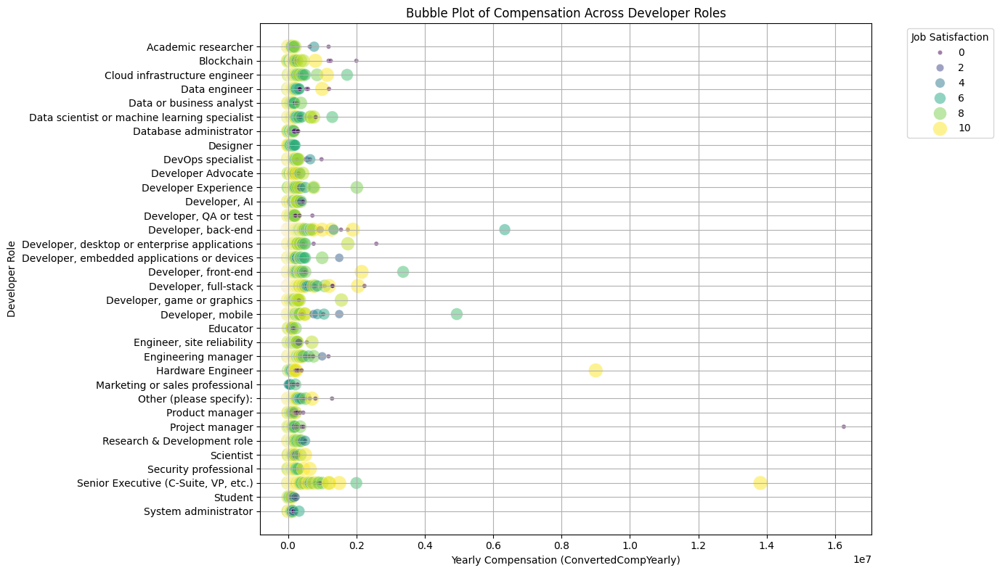

In [13]:
# Filter out rows with missing values in 'DevType', 'ConvertedCompYearly', and 'JobSat'
df_filtered = df.dropna(subset=['DevType', 'ConvertedCompYearly', 'JobSat'])

# Explode the 'DevType' column by splitting it by ';' and stacking the results
df_exploded = df_filtered.assign(DevType=df_filtered['DevType'].str.split(';')).explode('DevType')

# Calculate the frequency of each developer role within each compensation and job satisfaction level
devtype_compensation = df_exploded.groupby(['DevType', 'ConvertedCompYearly', 'JobSat']).size().reset_index(name='Frequency')

# Create the bubble plot
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(data=devtype_compensation, x='ConvertedCompYearly', y='DevType',
                              size='JobSat', sizes=(20, 200), alpha=0.5, hue='JobSat', palette='viridis')
plt.title('Bubble Plot of Compensation Across Developer Roles')
plt.xlabel('Yearly Compensation (ConvertedCompYearly)')
plt.ylabel('Developer Role')
plt.legend(title='Job Satisfaction', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Adjust the layout to ensure labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()

#### 2. Bubble Plot for Collaboration Tools by Age

- Visualize the relationship between the collaboration tools used (`NEWCollabToolsHaveWorkedWith`) and age groups.

- Use bubble size to represent the frequency of tool usage.


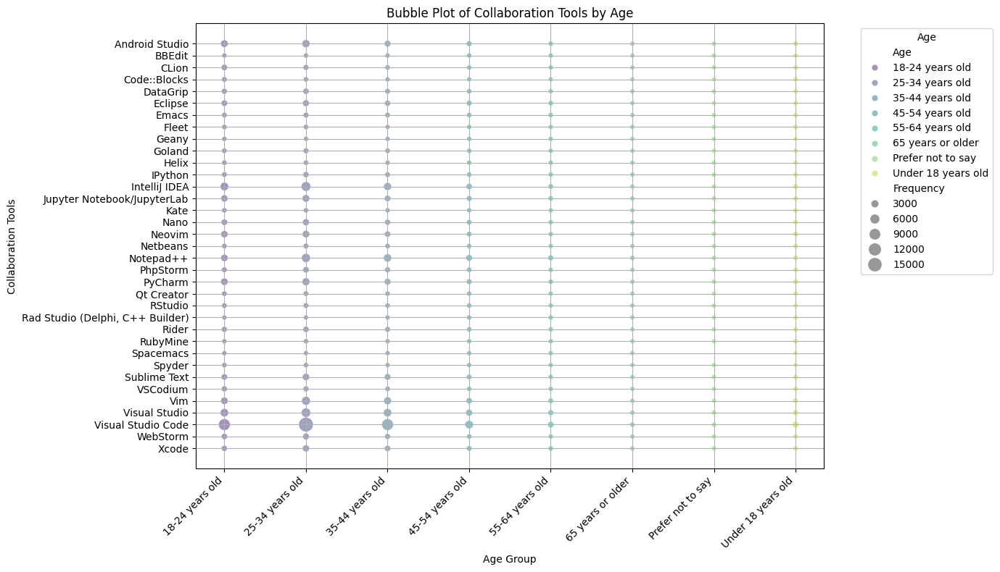

In [14]:
# prompt: write a code for Bubble Plot for Collaboration Tools by Age
# Visualize the relationship between the collaboration tools used (NEWCollabToolsHaveWorkedWith) and age groups.
# Use bubble size to represent the frequency of tool usage.

# Filter out rows with missing values in 'NEWCollabToolsHaveWorkedWith' and 'Age'
df_filtered = df.dropna(subset=['NEWCollabToolsHaveWorkedWith', 'Age'])

# Explode the 'NEWCollabToolsHaveWorkedWith' column
df_exploded = df_filtered.assign(NEWCollabToolsHaveWorkedWith=df_filtered['NEWCollabToolsHaveWorkedWith'].str.split(';')).explode('NEWCollabToolsHaveWorkedWith')

# Calculate the frequency of each tool within each age group
tool_age_freq = df_exploded.groupby(['NEWCollabToolsHaveWorkedWith', 'Age']).size().reset_index(name='Frequency')

# Create the bubble plot
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(data=tool_age_freq, x='Age', y='NEWCollabToolsHaveWorkedWith',
                              size='Frequency', sizes=(20, 200), alpha=0.5, hue='Age', palette='viridis')
plt.title('Bubble Plot of Collaboration Tools by Age')
plt.xlabel('Age Group')
plt.ylabel('Collaboration Tools')
plt.legend(title='Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Adjust the layout to ensure labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()

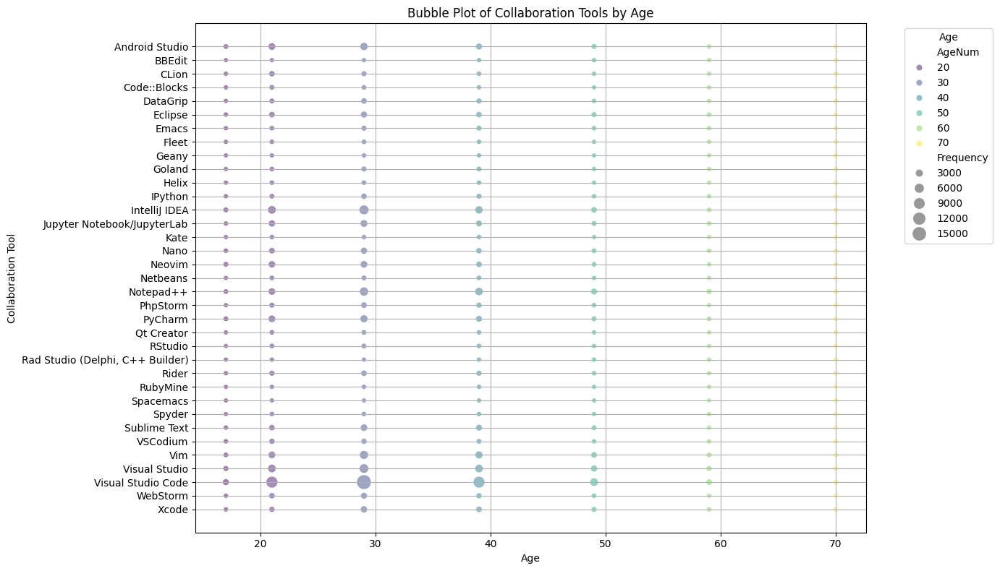

In [15]:
# Convert the 'Age' column to numeric values for bubble size
age_mapping = {
    'Under 18 years old': 17, '18-24 years old': 21, '25-34 years old': 29, '35-44 years old': 39,
    '45-54 years old': 49, '55-64 years old': 59, '65 years or older': 70, 'Prefer not to say': None
}
df['AgeNum'] = df['Age'].map(age_mapping)

# Filter out rows with missing values in 'NEWCollabToolsHaveWorkedWith' and 'AgeNum'
df_filtered = df.dropna(subset=['NEWCollabToolsHaveWorkedWith', 'AgeNum'])

# Explode the 'NEWCollabToolsHaveWorkedWith' column by splitting it by ';' and stacking the results
df_exploded = df_filtered.assign(NEWCollabToolsHaveWorkedWith=df_filtered['NEWCollabToolsHaveWorkedWith'].str.split(';')).explode('NEWCollabToolsHaveWorkedWith')

# Calculate the frequency of each collaboration tool within each age group
collabtools_age_freq = df_exploded.groupby(['NEWCollabToolsHaveWorkedWith', 'AgeNum']).size().reset_index(name='Frequency')

# Create the bubble plot
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(data=collabtools_age_freq, x='AgeNum', y='NEWCollabToolsHaveWorkedWith',
                              size='Frequency', sizes=(20, 200), alpha=0.5, hue='AgeNum', palette='viridis')
plt.title('Bubble Plot of Collaboration Tools by Age')
plt.xlabel('Age')
plt.ylabel('Collaboration Tool')
plt.legend(title='Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Adjust the layout to ensure labels are not cut off
plt.tight_layout()

# Show the plot
plt.show()

### Task 4: Visualizing Technology Trends Using Bubble Plots


#### 1. Bubble Plot for Preferred Web Frameworks vs. Job Satisfaction

- Explore the relationship between preferred web frameworks (`WebframeWantToWorkWith`) and job satisfaction.

- Use bubble size to represent the number of respondents.



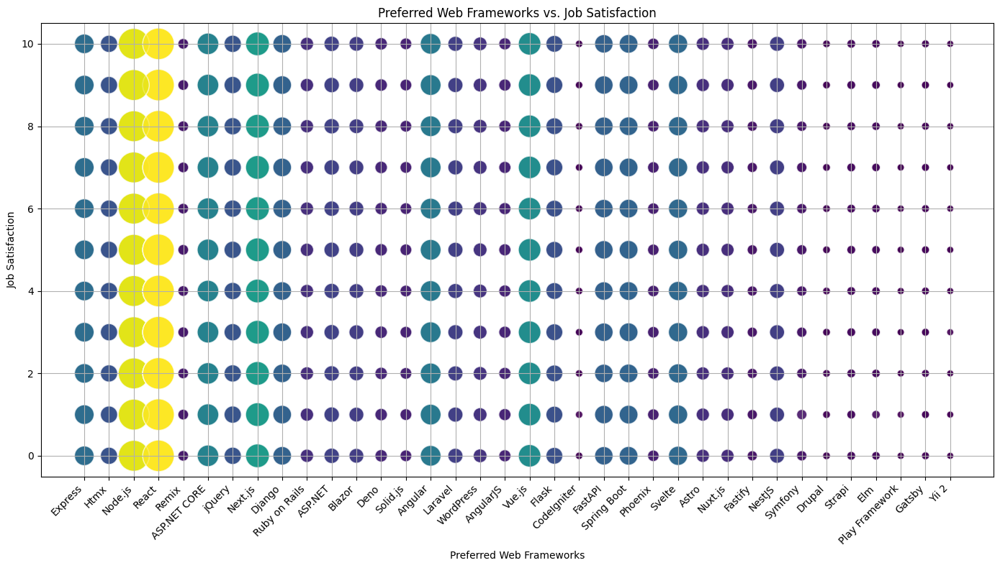

In [16]:
# prompt: write a code for Visualizing Technology Trends Using Bubble Plots
# 1. Bubble Plot for Preferred Web Frameworks vs. Job Satisfaction
# Explore the relationship between preferred web frameworks (WebframeWantToWorkWith) and job satisfaction.
# Use bubble size to represent the number of respondents.

# Filter out missing values
df_filtered = df.dropna(subset=['WebframeWantToWorkWith', 'JobSat'])

# Explode the 'WebframeWantToWorkWith' column
df_exploded = df_filtered.assign(WebframeWantToWorkWith=df_filtered['WebframeWantToWorkWith'].str.split(';')).explode('WebframeWantToWorkWith')

# Calculate the frequency of each framework
framework_counts = df_exploded.groupby('WebframeWantToWorkWith')['JobSat'].count().reset_index(name='RespondentCount')

# Merge with the original DataFrame for job satisfaction values
df_merged = pd.merge(df_exploded, framework_counts, on='WebframeWantToWorkWith')

# Filter out frameworks with very few responses (optional)
df_merged = df_merged[df_merged['RespondentCount'] > 10]

# Create the bubble plot
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df_merged, x='WebframeWantToWorkWith', y='JobSat', size='RespondentCount',
                sizes=(50, 1000), alpha=0.7, hue='RespondentCount', palette='viridis', legend=False)

# Customize the plot
plt.title('Preferred Web Frameworks vs. Job Satisfaction')
plt.xlabel('Preferred Web Frameworks')
plt.ylabel('Job Satisfaction')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()

plt.show()

#### 2. Bubble Plot for Admired Technologies Across Countries

- Visualize the distribution of admired technologies (`LanguageAdmired`) across different countries (`Country`).

- Use bubble size to represent the frequency of admiration.



## Final Step: Review


After completing the lab, you will have extensively used bubble plots to gain insights into developer community preferences, demographics, compensation trends, and job satisfaction.


## Summary


After completing this lab, you will be able to:

- Create and interpret bubble plots to analyze relationships and compositions within datasets.

- Use bubble plots to explore developer preferences, compensation trends, and satisfaction levels.

- Apply bubble plots to visualize complex relationships involving multiple dimensions effectively.


## Authors:
Ayushi Jain


### Other Contributors:
- Rav Ahuja
- Lakshmi Holla
- Malika


<!--
## Change Log
|Date (YYYY-MM-DD)|Version|Changed By|Change Description|
|-|-|-|-|
|2024-10-29|1.2|Madhusudhan Moole|Updated lab|
|2024-10-16|1.1|Madhusudhan Moole|Updated lab|
|2024-10-15|1.0|Raghul Ramesh|Created lab|
--!>


Copyright © IBM Corporation. All rights reserved.
